# STFT : originates from filter banks analyze

 - https://courses.engr.illinois.edu/ece420/sp2019/lab3/STFT.pdf
 - https://www.dsprelated.com/freebooks/sasp/Overlap_Add_OLA_STFT_Processing.html


Filter banks X(f, t) is simply frequency shifting input signal x(t) by -f (by multiply $e^{j2\pi ft}$ according CTFT property), and pass it through a low-pass filter with impulse response w(t) (the integral), and the result signal is X(f,t). Note it's a complex signal.
$$
X(f,t) = \int_{-\infty}^{\infty} w(t-\tau)x(\tau)e^{j2\pi f\tau} d\tau
$$

In digital form, it becomes:
$$
\begin{align*}
X(f,n) &= \sum_{k=-\infty}^{\infty} w[n-k] (x[k] e^{-j2\pi fk}) \\
       &= \sum_{k=-\infty}^{\infty} (w[n-k] x[k]) e^{-j2\pi fk} \\
       &= DTFT_{f} (w[n-k] x[k])
\end{align*}
$$

Note :
 - we have changed $e^{j2\pi fk}$ into $e^{-j2\pi fk}$ for easier analysis, and since for real value signal, negative frequency component is just complex conjugate of it's positive peer, we can think of the filter bank is shifting the negative frequency component f to zero.
 - we derived another interpretation: for any particular n, apply shifted & reverted window function w to x (not convolution. but simply multiply), and then do DTFT on result signal. since window has effective width, the sequence `w[n-k]x[k]` is also considered to be of limited length in time.
 - the window function should be low-pass to get a physically meaningful interpretation of the final spectragram, otherwise there maybe frequency leakage: see https://download.ni.com/evaluation/pxi/Understanding%20FFTs%20and%20Windowing.pdf for detail.

We don't need to calculate X(f, n) for each frequency and every time step:

 - for any f0, X(f0,n) can be viewed as output signal of low-pass filtering by w[k], so it can be further down-sampled according to the band-width of filter w, this determines the `hop length`.
 - for any n0, X(f, n0) can be viewed as DTFT on signal $w[n0-k]x[k]$ and we know by DFT that N samples are enough.

Here is python implementation and demo on creating spectrogram:

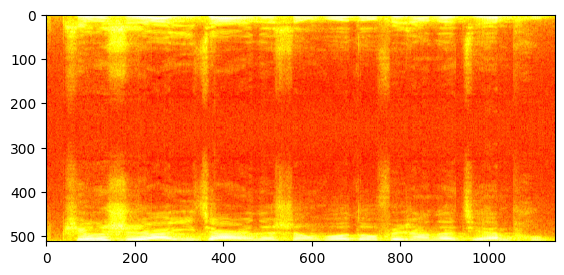

In [1]:
from scipy.fft import fft, ifft, fftfreq
from scipy import signal
import numpy as np
import IPython
import matplotlib.pyplot as plt
from vscode_audio import Audio
from lpc_helper import *
%matplotlib inline

fs=44100
wnd_size = 256
step = int(fs*0.002)

# frequency resolution, input may be cropped/padded to get lower/higher frequency resolution
FFT_N = 512 
x = load_wave("wavs/m0.wav")

window = signal.windows.hann(wnd_size)
Spectrum = []
for i in range(0, len(x) - wnd_size, step):
    Xmag = np.abs(fft(x[i:i+wnd_size]*window, FFT_N))
    Spectrum.append(Xmag)

map = 20 * np.log10(np.array(Spectrum).T)
plt.figure(figsize=(16,3), dpi= 100, facecolor='w', edgecolor='k')
plt.imshow(map, cmap='hot')

##  STFT: Reconstruct

Inverse DFT can recover windowed signal, to remove the window, OLA(overlapped add) can further remove the window factor.
The author proved it using Possion summation formula:

$$
\begin{align*}
w(t) &\xtofrom{CTFT} W(f)=\int_{-\infty}^{\infty} w(t)w^{-j2\pi ft} dt \\

w(Dt-k) &\xtofrom{CTFT} \frac{e^{-j2\pi fk/D}}{D} \int_{-\infty}^{\infty} w(t)w^{-j2\pi \frac{f}{D} t} dt \\
        &=  \frac{e^{-j2\pi fk/D}}{D} W(f/D) \\
\end{align*}
$$

Using Possion summation formula on w(Dt-k) for t at integer time stamps:

$$
\begin{align*}
\sum_{t=-\infty}^{\infty} w(Dt-k) &= \frac{1}{D} \sum_{f=-\infty}^{\infty} e^{-j2\pi fk/D} W(f/D) \\
                                  &= \frac{1}{D} ( W(0) + \sum_{n\neq 0} e^{-j2\pi nk/D} W(n/D))
\end{align*}
$$

Because W is low-pass, W(n/D) is negligible for small enough D (the smaller the better, but computation will be redundant), and so the k-dependent items in above equation can be ignored, thus OLA produces constant summation weight irrelevant to k.

Possion summation formula (Note the summation is only over integer time point of a continuous time signal):
 - https://www.youtube.com/watch?v=4Bex-4BFYWo
 - https://www.youtube.com/watch?v=aeCjkbIXjRs&list=PL2uXHjNuf12a6HqT9qCS5J9eK_K5s7F8S&t=0s
   
   the proving process depeding on a non-convergent summation of exponential function ()



# Example: FIR filter



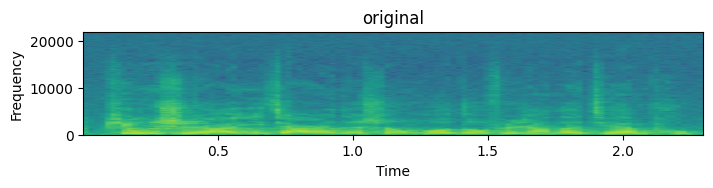

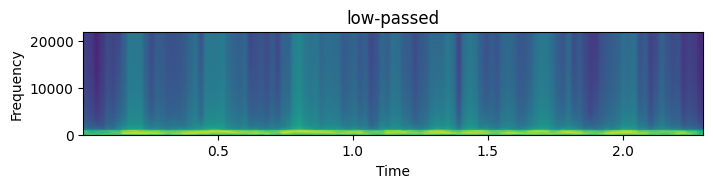

In [2]:

def STFT_filter(x, fs, wnd_size, hop, filter):
    filter_FFT = np.abs(fft(filter))

    window = signal.windows.hann(wnd_size)
    window = window*hop/np.sum(window)

    Nx = len(x)
    y = np.zeros([Nx])

    i = 0
    while(i < Nx-wnd_size):
        X = fft(x[i:i+wnd_size] * window)
        mag, phase = np.abs(X), np.angle(X)
        mag *= filter_FFT
        iy = ifft(mag * np.exp(1j*phase))
        y[i:i+wnd_size] += iy.real
        i += hop
    return y

fs = 44100
fpass = 1000
x = load_wave("wavs/m0.wav")
wnd_size=1024
hop = 256
window = signal.windows.hann(wnd_size)

# design low pass filter
h = signal.firwin(wnd_size, fpass, fs = fs)

# do the filter with STFT+OLA
y = STFT_filter(x, fs, wnd_size, hop, h)
play_sound(x, rate=fs, name="original", spectrum=1, waveform=0, figsize=(8,3))
play_sound(y, rate=fs, name="low-passed", spectrum=1, waveform=0, figsize=(8,3))


# Example: Phase vocoder

 - https://www.youtube.com/watch?v=h5o7jeddU0c
 - https://ww2.mathworks.cn/help/audio/ug/pitch-shifting-and-time-dilation-using-a-phase-vocoder-in-matlab.html
 - https://ww2.mathworks.cn/help/dsp/ref/dsp.stft.html

This is a direct application of STFT framework to perform time stretching w/o spectrum change.

It reveals how STFT framework works in programing language and also how it's applied to solve time stretching problem.

STFT uses hop length 64 but ISTFT uses 90, so every 64 more samples input would generate 90 more samples output, with window length 256.

from the code we can see:
 - STFT/ISTFT windows sizes are matched: both is set to be 256 (for 8KHz sample rate)
 - hop size is different so ISTFT generates longger time sequence
 - phase scaling is required to predict phase change at different ISTFT hop length.


```matlab
WindowLen = 256;
AnalysisLen = 64;
SynthesisLen = 90;
Hopratio = SynthesisLen/AnalysisLen;
unwrapdata = 2*pi*AnalysisLen*(0:WindowLen-1)'/WindowLen;
yangle = zeros(WindowLen,1);
firsttime = true;
...
while ~isDone(reader)
    y = reader();

    player(y); % Play back original audio

    % ST-FFT
    yfft = stft(y);
    
    % Convert complex FFT data to magnitude and phase.
    ymag       = abs(yfft);
    yprevangle = yangle;
    yangle     = angle(yfft);

    % Synthesis Phase Calculation
    % The synthesis phase is calculated by computing the phase increments
    % between successive frequency transforms, unwrapping them, and scaling
    % them by the ratio between the analysis and synthesis hop sizes.
    yunwrap = (yangle - yprevangle) - unwrapdata;
    yunwrap = yunwrap - round(yunwrap/(2*pi))*2*pi;
    yunwrap = (yunwrap + unwrapdata) * Hopratio;
    if firsttime
        ysangle = yangle;
        firsttime = false;
    else
        ysangle = ysangle + yunwrap;
    end

    % Convert magnitude and phase to complex numbers.
    ys = ymag .* complex(cos(ysangle), sin(ysangle));

    % IST-FFT
    yistfft = istft(ys);

    logger(yistfft) % Log signal 
end
```



## Re-implementation with python

#### Phase prediction:

For each exponential sinusodial component, phase is natrually increasing with time even for static spectral signal:

consider inverse FFT equation (https://docs.scipy.org/doc/scipy/tutorial/fft.html):
$$
   x[n]=IFFT_{n}(y) = \frac{1}{N}\sum_{k=0}^{N-1} e^{2\pi j kn/N} y[k]
$$

Now apply this equation to predict samples at D time steps later:
$$
\begin{align*}
   x[n+D] &= IFFT_{n+D}(y) \\
          &= \frac{1}{N}\sum_{k=0}^{N-1} e^{2\pi j k(n+D)/N} y[k] \\
          &= \frac{1}{N}\sum_{k=0}^{N-1} e^{2\pi j kn/N} (e^{2\pi j kD/N} y[k]) \\
          &= IFFT_{n}(e^{2\pi j kD/N} y[k])
\end{align*}
$$

Which means the k'th FFT coefficients of window begining at D time steps later will have same magnitude, but with phase beging naturally added/shifted by $2\pi j kD/N$.

On the other hand, if signal is not static, it's phase will have additional change over the natural increasing part $2\pi j kD/N$, and that part of change can be sampled by substracting phase of input windows p-1 and natural phase increase from observed phase of input windows p. also we can assume this change is happening linearly, so we can predict it for time step at which output window begins.

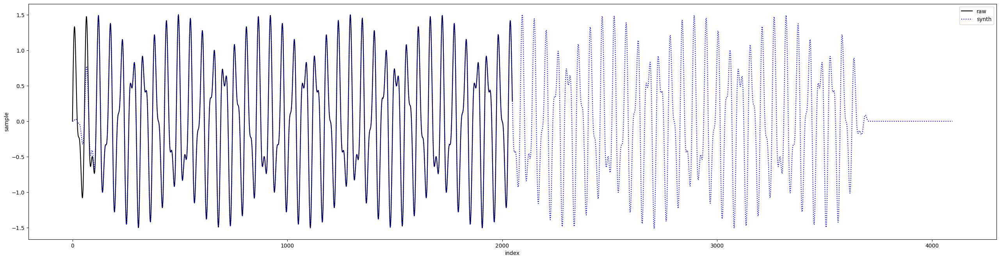

In [34]:
def STFT_time_freq_stretch(x, fs, wnd_size, hop_in, hop_out = 0):
    window = signal.windows.hann(wnd_size)
    window = window*hop_in/np.sum(window)

    Nx = len(x)
    Ny = Nx*hop_out//hop_in
    y = np.zeros([Ny])

    phase_last = []
    phase_y = []
    phase_inc_in = 2*np.pi*hop_in*np.arange(0, wnd_size)/wnd_size
    phase_inc_out = 2*np.pi*hop_out*np.arange(0, wnd_size)/wnd_size

    i = k = 0
    while(i < Nx-wnd_size and k < Ny-wnd_size):
        X = fft(x[i:i+wnd_size] * window)
        mag, phase = np.abs(X), np.angle(X)

        if len(phase_last)==0:
            phase_last = phase
            phase_y = phase
        else:
            phase_delta = phase - (phase_last + phase_inc_in)
            phase_last = phase

            phase_delta -= (phase_delta//(2*np.pi)).round()*2*np.pi

            phase_y += phase_inc_out + phase_delta * hop_out/hop_in

        iy = ifft(mag * np.exp(1j*phase_y))

        y[k:k+wnd_size] += iy.real * hop_out/hop_in
        i += hop_in
        k += hop_out
    return y


wnd_size=256
fs = 8000
hop_in = 64
hop_out = 128

Nx = wnd_size*8
tx = np.linspace(0.0, Nx/fs, Nx, endpoint=False)
x = np.sin(150.0 * 2.0*np.pi*tx) + 0.5*np.sin(280.0 * 2.0*np.pi*tx)

y = STFT_time_freq_stretch(x, fs, wnd_size, hop_in, hop_out)

plt.figure(figsize=(32,8), dpi=100, facecolor='w', edgecolor='k')
plt.plot(x, 'k-',label="raw")
plt.plot(y, 'b:',label="synth")
plt.legend()
plt.xlabel("index")
plt.ylabel("sample")

# now try a real sample
m0 = load_wave("wavs/m0.wav")
sr = 44100

time_stretched = STFT_time_freq_stretch(m0, sr, 1024, 100, 200)
frequency_scaled = scipy.signal.resample(time_stretched, len(m0))

play_sound(m0, rate=sr, name="original", spectrum=-1, waveform=0)
play_sound(time_stretched, rate=sr, name="time stretched with STFT", spectrum=-1, waveform=0)
play_sound(frequency_scaled, rate=sr, name="frequency_scaled_up", spectrum=-1, waveform=0)

time_stretched = STFT_time_freq_stretch(m0, sr, 1024, 100, 60)
frequency_scaled = scipy.signal.resample(time_stretched, len(m0))
play_sound(time_stretched, rate=sr, name="time stretched2 with STFT", spectrum=-1, waveform=0)
play_sound(frequency_scaled, rate=sr, name="frequency_scaled_down", spectrum=-1, waveform=0)

## Frequency shift using STFT

 - https://www.surina.net/article/time-and-pitch-scaling.html
 - F. Charpentier and M. Stella. "Diphone synthesis using an overlap-add technique for speech waveforms concatenation." In Int. Conf. Acoustics, Speech, and Signal Processing (ICASSP). Vol. 11. IEEE, 1986.

The authors of above articles claims that STFT can be used to shift frequency directly using interpolation in frequency domain.

$$

$$